# Spectral Images Generation

An exploratory notebook about spectral images generation.

More information is available on [ACEScentral](https://acescentral.com/c/aces-development-acesnext/vwg-aces-gamut-mapping-working-group/) and  and [colour-science.discourse.group](https://colour-science.discourse.group/t/spectral-images-generation/)

*TODO*:

* Add Motion Pictures Camera sensitivities
* Decide on which DSLR sensitivities
* Decide on the lights spectrum
* Perform IDTs computation as per the book

## Google Drive

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
OUTPUT_DIRECTORY = '/content/drive/My Drive/Fast.io/academy-vwg-gm-spectral-spheres.imfast.io'

## colour-science Requirements

In [0]:
!pip install colour-datasets
!pip install gdown
!pip install networkx

!python -c "import imageio;imageio.plugins.freeimage.download()"

!pip uninstall -y colour-science
!if ! [ -d "colour" ]; then git clone https://github.com/colour-science/colour; fi
!if [ -d "colour" ]; then cd colour && git fetch && git checkout develop && git pull && cd ..; fi

import sys
sys.path.append('colour')

!mkdir -p /content/downloads

     |████████████████████████████████| 102kB 3.2MB/s 
     |████████████████████████████████| 1.6MB 8.9MB/s 
Imageio: 'libfreeimage-3.16.0-linux64.so' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/freeimage/libfreeimage-3.16.0-linux64.so (4.6 MB)
Downloading: 8192/4830080 bytes (0.2%)712704/4830080 bytes (14.8%)2015232/4830080 bytes (41.7%)3883008/4830080 bytes (80.4%)4830080/4830080 bytes (100.0%)
  Done
File saved as /root/.imageio/freeimage/libfreeimage-3.16.0-linux64.so.
Uninstalling colour-science-0.3.15:
  Successfully uninstalled colour-science-0.3.15
Cloning into 'colour'...
remote: Enumerating objects: 155, done.
remote: Counting objects: 100% (155/155), done.
remote: Compressing objects: 100% (126/126), done.
remote: Total 41005 (delta 56), reused 66 (delta 28), pack-reused 40850
Recei

In [0]:
import colour
import colour_datasets
import colour.plotting
import matplotlib.pyplot as plt
import numpy as np
import random
import re
import scipy.ndimage
import textwrap
import tqdm

colour.plotting.colour_style()

plt.style.use({'figure.figsize': (19.80, 10.80)})

colour.utilities.describe_environment();

*                                                                             *
*   Interpreter :                                                             *
*       python : 3.6.9 (default, Nov  7 2019, 10:44:02)                       *
*                [GCC 8.3.0]                                                  *
*                                                                             *
*   colour-science.org :                                                      *
*       colour : v0.3.15-17-g1de08205                                         *
*       colour-datasets : 0.1.0                                               *
*                                                                             *
*   Runtime :                                                                 *
*       imageio : 2.4.1                                                       *
*       matplotlib : 3.1.3                                                    *
*       networkx : 2.4                  

## Cameras Sensitivites Datasets

In [0]:
print(colour_datasets.datasets())

colour-science-datasets

Datasets : 16
Synced   : 0
URL      : https://zenodo.org/communities/colour-science-datasets/

Datasets
--------

[ ] 3269926 : Agfa IT8.7/2 Set
[ ] 3245883 : Camera Spectral Sensitivity Database
[ ] 3367463 : Constant Hue Loci Data
[ ] 3362536 : Constant Perceived-Hue Data
[ ] 3270903 : Corresponding-Colour Datasets
[ ] 3269920 : Forest Colors
[ ] 3245875 : Labsphere SRS-99-020
[ ] 3269924 : Lumber Spectra
[ ] 3269918 : Munsell Colors Glossy (All) (Spectrofotometer Measured)
[ ] 3269916 : Munsell Colors Glossy (Spectrofotometer Measured)
[ ] 3269914 : Munsell Colors Matt (AOTF Measured)
[ ] 3269912 : Munsell Colors Matt (Spectrofotometer Measured)
[ ] 3245895 : New Color Specifications for ColorChecker SG and Classic Charts
[ ] 3252742 : Observer Function Database
[ ] 3269922 : Paper Spectra
[ ] 3372171 : RAW to ACES Utility Data


In [0]:
CAMERA_SENSITIVITIES_DATABASE = colour_datasets.load(
    'Camera Spectral Sensitivity Database')
AMPAS_CAMERA_SENSITIVITIES_DATABASE = colour_datasets.load(
    'RAW to ACES Utility Data')

TRAINING_DATA = AMPAS_CAMERA_SENSITIVITIES_DATABASE['training']['190-patch']

COMPOSITE_CAMERA_SENSITIVITIES_DATABASE = CAMERA_SENSITIVITIES_DATABASE.copy()
COMPOSITE_CAMERA_SENSITIVITIES_DATABASE.update(
    AMPAS_CAMERA_SENSITIVITIES_DATABASE['camera'])

CAMERA_NAMES = sorted(COMPOSITE_CAMERA_SENSITIVITIES_DATABASE.keys())

print(CAMERA_NAMES)

Pulling "Camera Spectral Sensitivity Database" record content...


colour/colour/utilities/verbose.py:235: ColourWarning: An error occurred using urls from "urls.txt" file: "urls.txt" file was not found in record data!
Switching to record urls...
  warn(*args, **kwargs)

Pulling "RAW to ACES Utility Data" record content...


Unpacking "/root/.colour-science/colour-datasets/3372171/dataset/data.zip" archive...
['Canon 1DMarkIII', 'Canon 20D', 'Canon 300D', 'Canon 40D', 'Canon 500D', 'Canon 50D', 'Canon 5DMarkII', 'Canon 600D', 'Canon 60D', 'Hasselblad H2', 'Nikon D200', 'Nikon D3', 'Nikon D300s', 'Nikon D3X', 'Nikon D40', 'Nikon D50', 'Nikon D5100', 'Nikon D700', 'Nikon D80', 'Nikon D90', 'Nokia N900', 'Olympus E-PL2', 'Pentax K-5', 'Pentax Q', 'Phase One', 'Point Grey Grasshopper 50S5C', 'Point Grey Grasshopper2 14S5C', 'SONY NEX-5N', 'arri d21', 'canon eos 5d mark ii', 'canon powershot s90', 'canon xti', 'nikon d200', 'nikon d5100', 'nikon d70', 'nikon d700', 'nikon d7000', 'sony ilce-7rm2', 'sony ilce-7sm2']


## Lighting Mask

In [0]:
!gdown https://drive.google.com/uc?id=1odwVRH_nntmVY18N_CRSDkqhazvrs0uU -O /content/downloads/Stanford_Bunny_White.exr
!gdown https://drive.google.com/uc?id=1Z2_auUcOizXyMixXj-Qb5c6Kv1YHwwhP -O /content/downloads/Sphere_White.exr

Downloading...
From: https://drive.google.com/uc?id=1odwVRH_nntmVY18N_CRSDkqhazvrs0uU
To: /content/downloads/Stanford_Bunny_White.exr
100% 504k/504k [00:00<00:00, 61.3MB/s]
Downloading...
From: https://drive.google.com/uc?id=1Z2_auUcOizXyMixXj-Qb5c6Kv1YHwwhP
To: /content/downloads/Sphere_White.exr
100% 988k/988k [00:00<00:00, 60.2MB/s]


colour/colour/utilities/verbose.py:235: ColourUsageWarning: "OpenImageIO" related API features are not available, switching to "Imageio"!
  warn(*args, **kwargs)


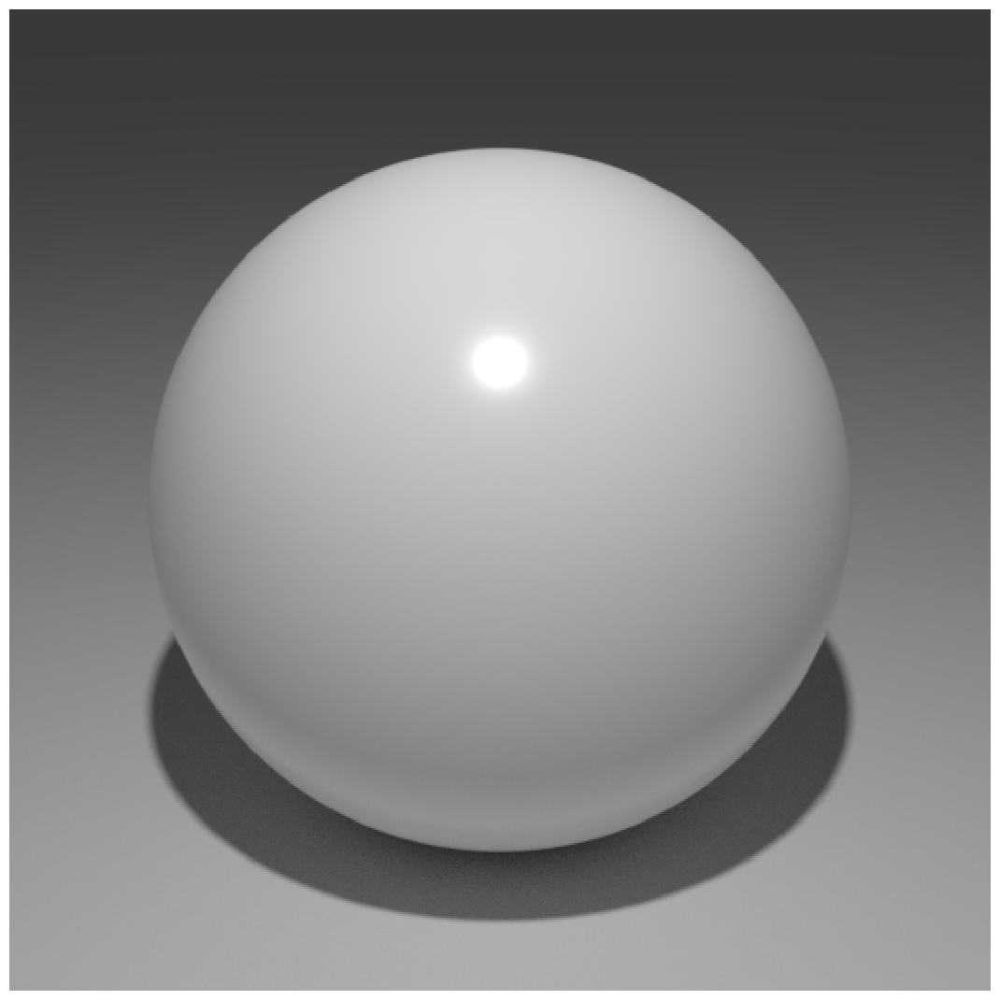

In [0]:
LIGHTING_MASK = colour.read_image('/content/downloads/Sphere_White.exr')

colour.plotting.plot_image(colour.cctf_encoding(LIGHTING_MASK[...,0:3]));

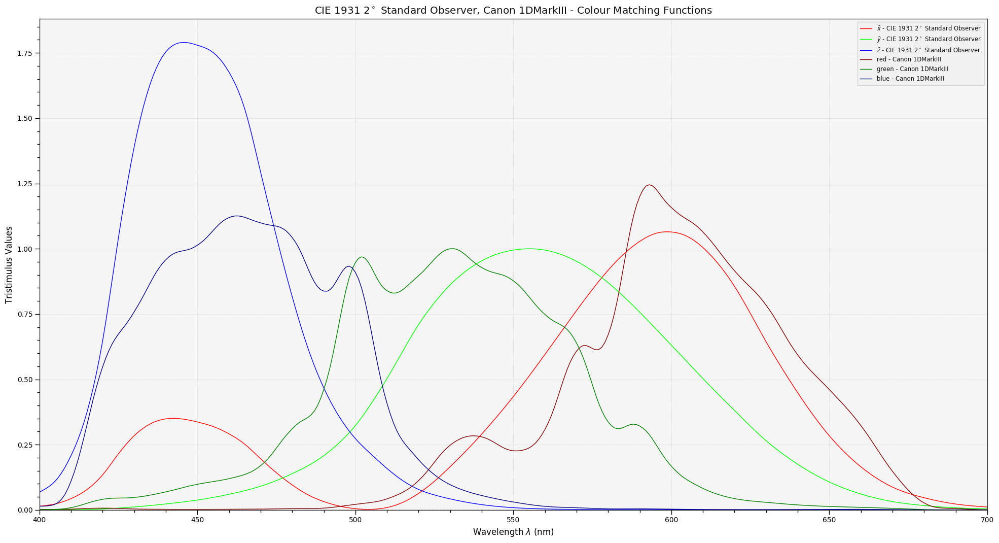

In [0]:
INTERVAL = 1  # Spectral bin size.

SHAPE = colour.SpectralShape(400, 700, INTERVAL)
WAVELENGTHS = SHAPE.range()


def normalise_multi_signal(multi_signal):
    multi_signal = multi_signal.copy()

    multi_signal.values = multi_signal.values / (
        colour.sd_to_XYZ(colour.sd_ones(), cmfs=multi_signal) / 100)

    return multi_signal


CMFS_NAME = 'CIE 1931 2 Degree Standard Observer'
CMFS = normalise_multi_signal(colour.CMFS[CMFS_NAME].copy().align(SHAPE))

COMPOSITE_CAMERA_SENSITIVITIES_DATABASE = {
    name: normalise_multi_signal(sensitivities.copy().align(SHAPE))
    for name, sensitivities in COMPOSITE_CAMERA_SENSITIVITIES_DATABASE.items()
}


colour.plotting.plot_multi_cmfs(
    [CMFS, COMPOSITE_CAMERA_SENSITIVITIES_DATABASE[CAMERA_NAMES[0]]]);

## Pseudo-IDT Matrices

In [0]:
ILLUMINANT_A = colour.ILLUMINANTS_SDS['A']
CCT_A = colour.uv_to_CCT(
    colour.xy_to_UCS_uv(colour.XYZ_to_xy(colour.sd_to_XYZ(ILLUMINANT_A))))[0]
ILLUMINANT_B = colour.ILLUMINANTS_SDS['D65']
CCT_B = colour.uv_to_CCT(
    colour.xy_to_UCS_uv(colour.XYZ_to_xy(colour.sd_to_XYZ(ILLUMINANT_B))))[0]

TRAINING_DATA_SDS = np.transpose(
    TRAINING_DATA.copy().interpolate(SHAPE).values)


def generate_IDT_matrix(cmfs, sensitivities, illuminant, training_sds):
    XYZ_r = colour.multi_sds_to_XYZ(
        training_sds,
        method='Integration',
        cmfs=cmfs,
        illuminant=illuminant,
        shape=SHAPE) / 100

    XYZ_t = colour.multi_sds_to_XYZ(
        training_sds,
        method='Integration',
        cmfs=sensitivities,
        illuminant=illuminant,
        shape=SHAPE) / 100

    M = colour.colour_correction_matrix(XYZ_t, XYZ_r)

    D = np.diag(np.tile(1 / np.sum(M[1]), 3))

    return colour.utilities.dot_matrix(M, D)


M_IDT_A = {
    camera: generate_IDT_matrix(CMFS, sensitivities, ILLUMINANT_A,
                                TRAINING_DATA_SDS)
    for camera, sensitivities in COMPOSITE_CAMERA_SENSITIVITIES_DATABASE.items()
}
M_IDT_B = {
    camera: generate_IDT_matrix(CMFS, sensitivities, ILLUMINANT_B,
                                TRAINING_DATA_SDS)
    for camera, sensitivities in COMPOSITE_CAMERA_SENSITIVITIES_DATABASE.items()
}


## Spectral Image Generation

colour/colour/utilities/verbose.py:235: ColourUsageWarning: The "Automatic Colour Conversion Graph" is a beta feature, be mindful of this when using it. Please report any unexpected behaviour and do not hesitate to ask any questions should they arise.
This warning can be disabled with the "colour.utilities.suppress_warnings" context manager as follows:
with colour.utilities.suppress_warnings(colour_usage_warnings=True): 
    convert(*args, **kwargs)
  warn(*args, **kwargs)


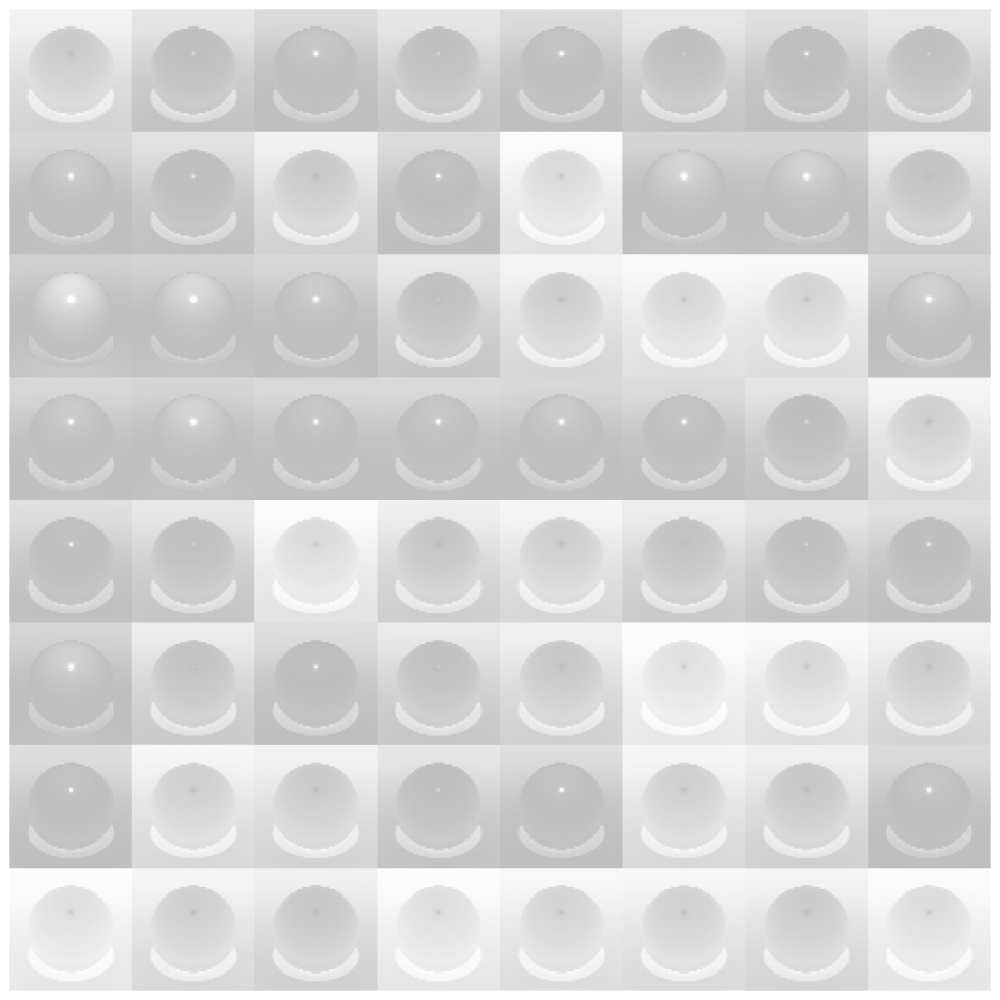

In [0]:
SWATCHES = 8

LIGHTING_MASK_S = scipy.ndimage.zoom(LIGHTING_MASK, (0.125, 0.125, 1))

LIGHTING_MASK_S /= np.mean(LIGHTING_MASK_S) * 1.5

random.seed(8)
MSDS_SWATCHES = np.array(
    random.sample(TRAINING_DATA_SDS.tolist(), SWATCHES * SWATCHES))

MSDS_XYZ = colour.multi_sds_to_XYZ(
    MSDS_SWATCHES,
    method='Integration',
    cmfs=CMFS,
    illuminant=ILLUMINANT_B,
    shape=SHAPE) / 100

IJK = colour.convert(MSDS_XYZ, 'CIE XYZ', 'CIE LChab')
INDICES = np.lexsort([IJK[..., 0], IJK[..., 2], IJK[..., 1]])
MSDS_SWATCHES = MSDS_SWATCHES[INDICES].reshape([SWATCHES, SWATCHES, -1])
# MSDS_SWATCHES = MSDS_SWATCHES.reshape([SWATCHES, SWATCHES, -1])

REPEAT = LIGHTING_MASK_S.shape[0] * SWATCHES // MSDS_SWATCHES.shape[0]
SPECTRAL_IMAGE = MSDS_SWATCHES.repeat(REPEAT, axis=0).repeat(REPEAT, axis=1)
SPECTRAL_IMAGE *= np.tile(LIGHTING_MASK_S[..., 0],
                          [SWATCHES, SWATCHES])[..., np.newaxis]

colour.plotting.plot_image(colour.cctf_encoding(SPECTRAL_IMAGE[:, :, 30:34]));

## LED Light Sources

colour/colour/utilities/verbose.py:235: ColourUsageWarning: "RGB_Colourspace.illuminant" object has been renamed to "RGB_Colourspace.whitepoint_name".
  warn(*args, **kwargs)


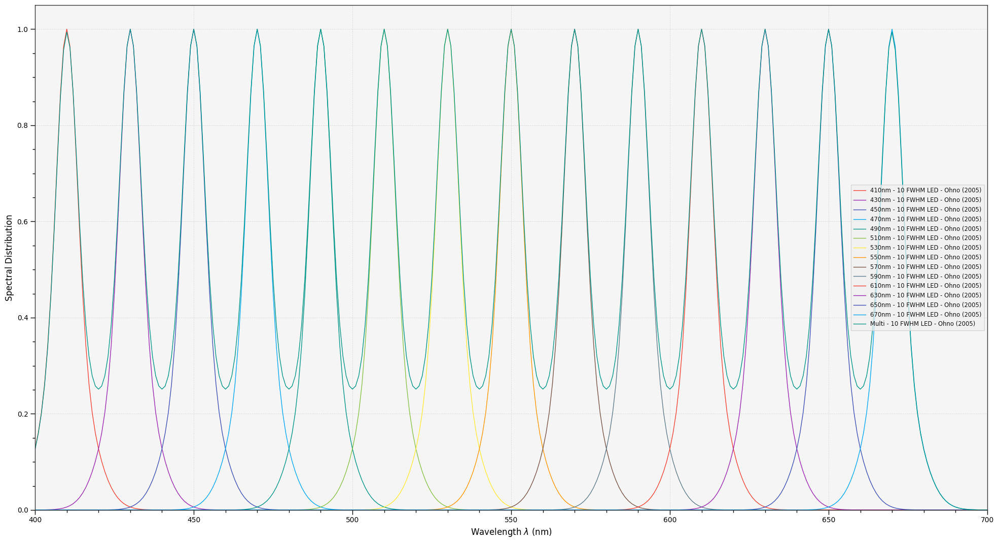

In [0]:
FWHM = 10
LED_WAVELENGTHS = np.arange(SHAPE.start + FWHM, SHAPE.end - FWHM, 20)

LIGHT_SOURCES = {
    i: colour.sd_single_led(i, FWHM).align(SHAPE)
    for i in LED_WAVELENGTHS
}
LIGHT_SOURCE_W = colour.sd_multi_leds(LED_WAVELENGTHS,
                                        FWHM).align(SHAPE).normalise(1)
LIGHT_SOURCE_W.name = 'Multi - {0} FWHM LED - Ohno (2005)'.format(FWHM)

CCT_LIGHT_SOURCES = {
    name: colour.uv_to_CCT(
        colour.xy_to_UCS_uv(colour.XYZ_to_xy(
            colour.sd_to_XYZ(light_source))))[0]
    for name, light_source in LIGHT_SOURCES.items()
}

colour.plotting.plot_multi_sds(list(LIGHT_SOURCES.values()) + [LIGHT_SOURCE_W]);

## Camera Data Rendering

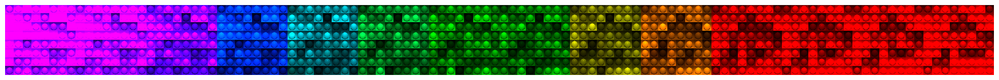

colour/colour/utilities/verbose.py:235: ColourUsageWarning: "OpenImageIO" related API features are not available, switching to "Imageio"!
  warn(*args, **kwargs)


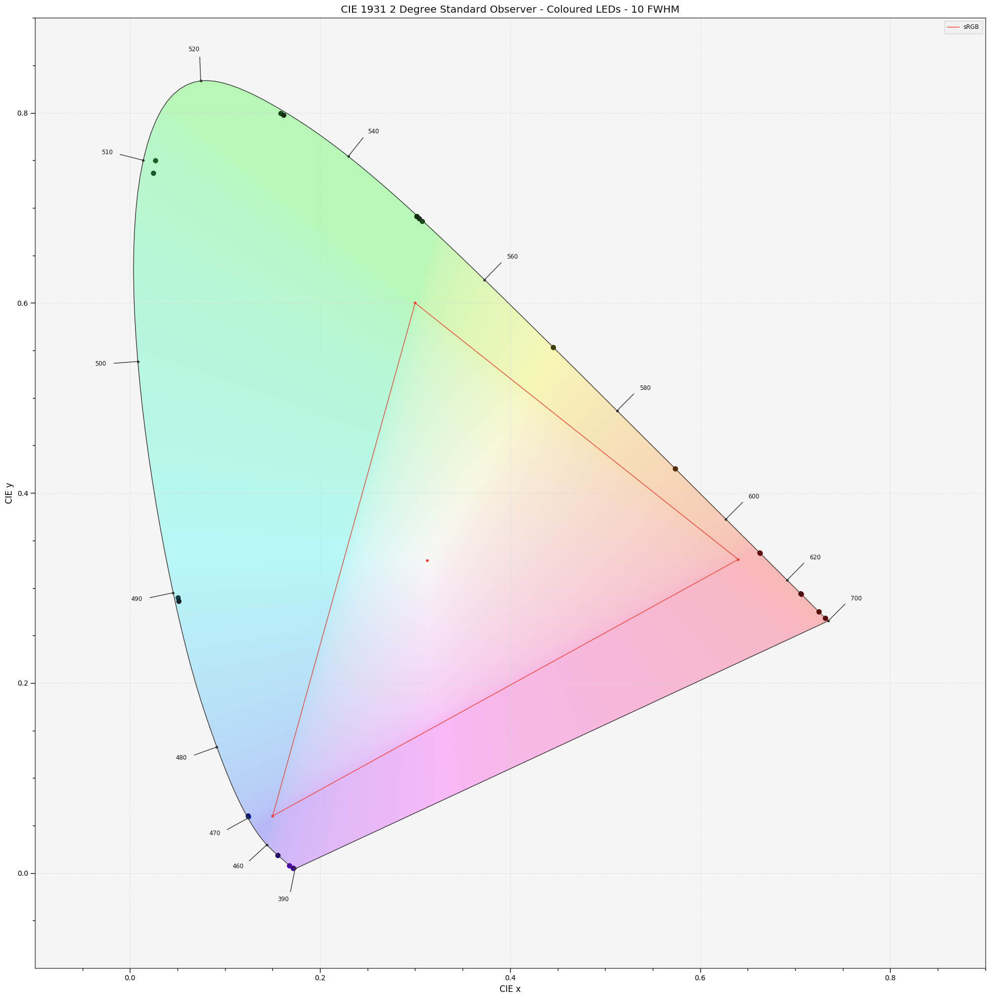

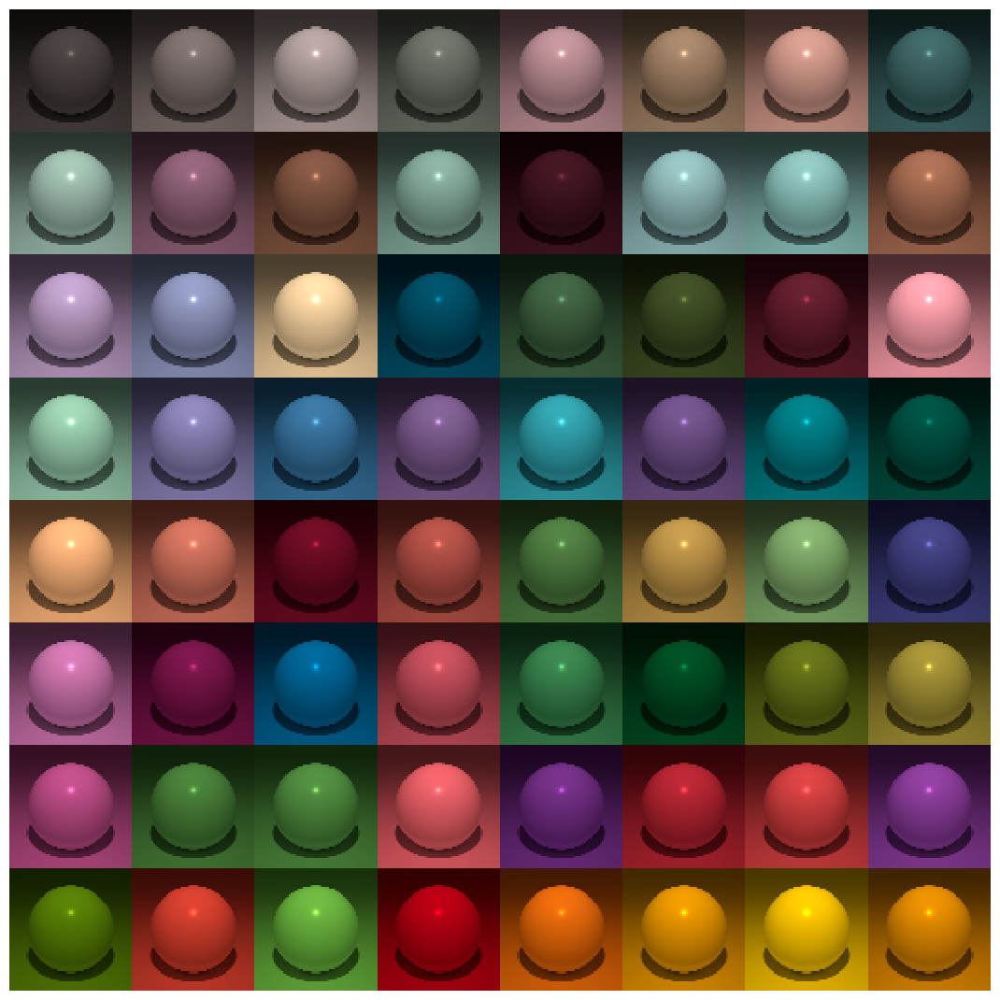

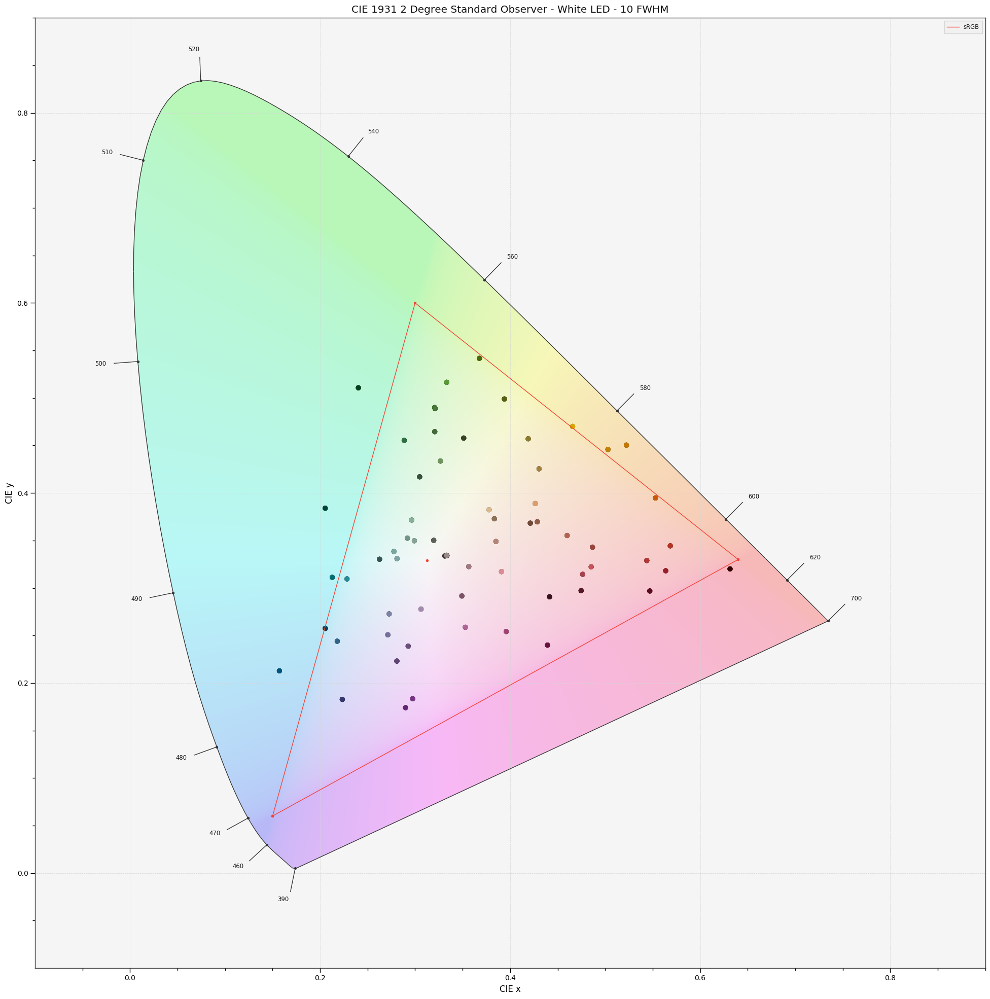

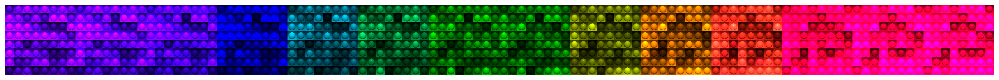

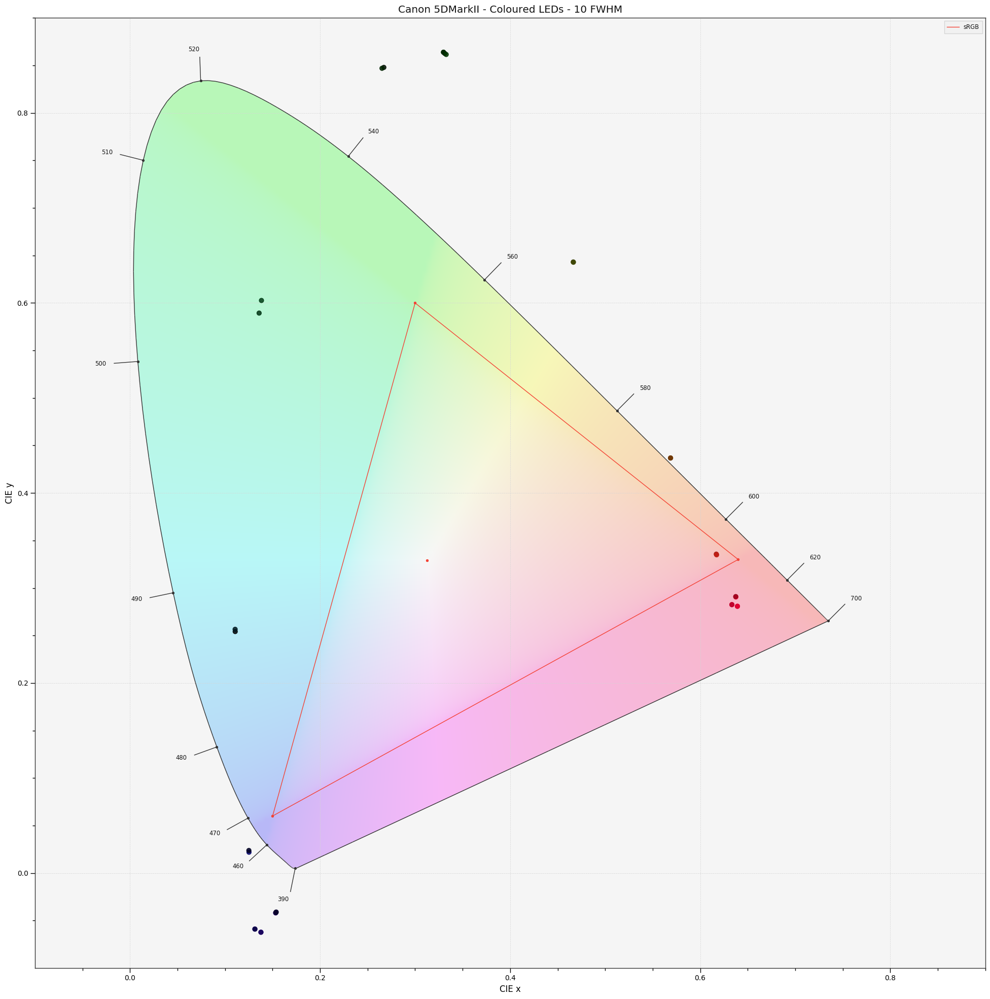

...

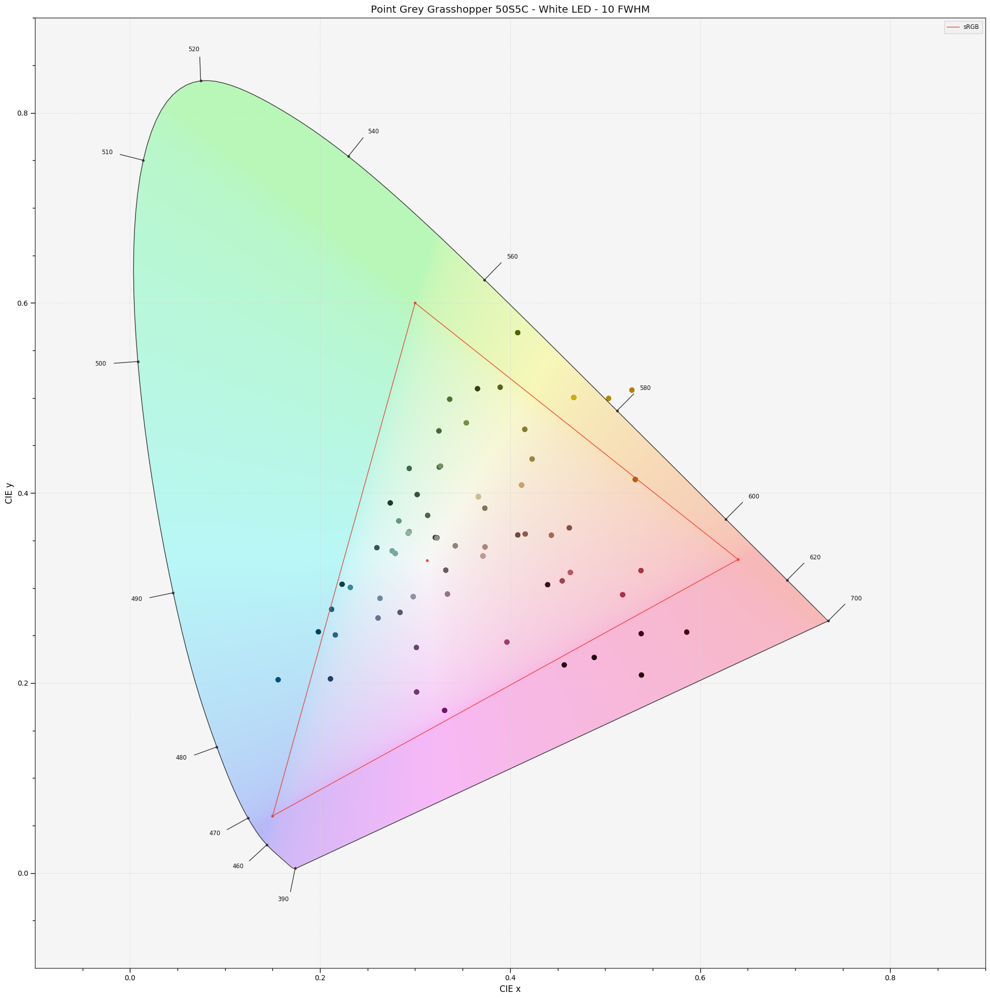

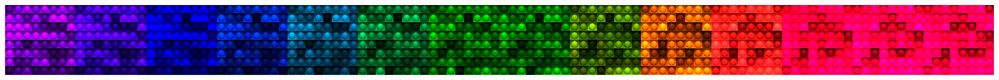

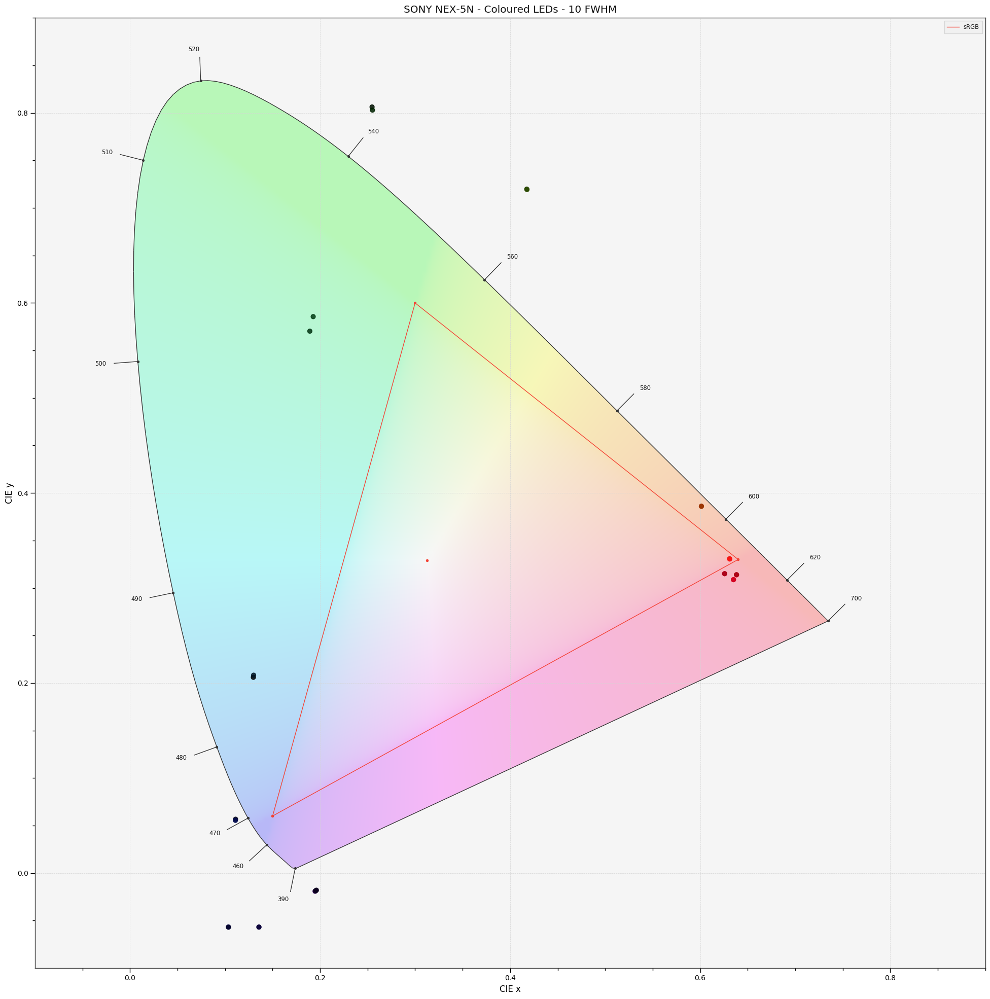

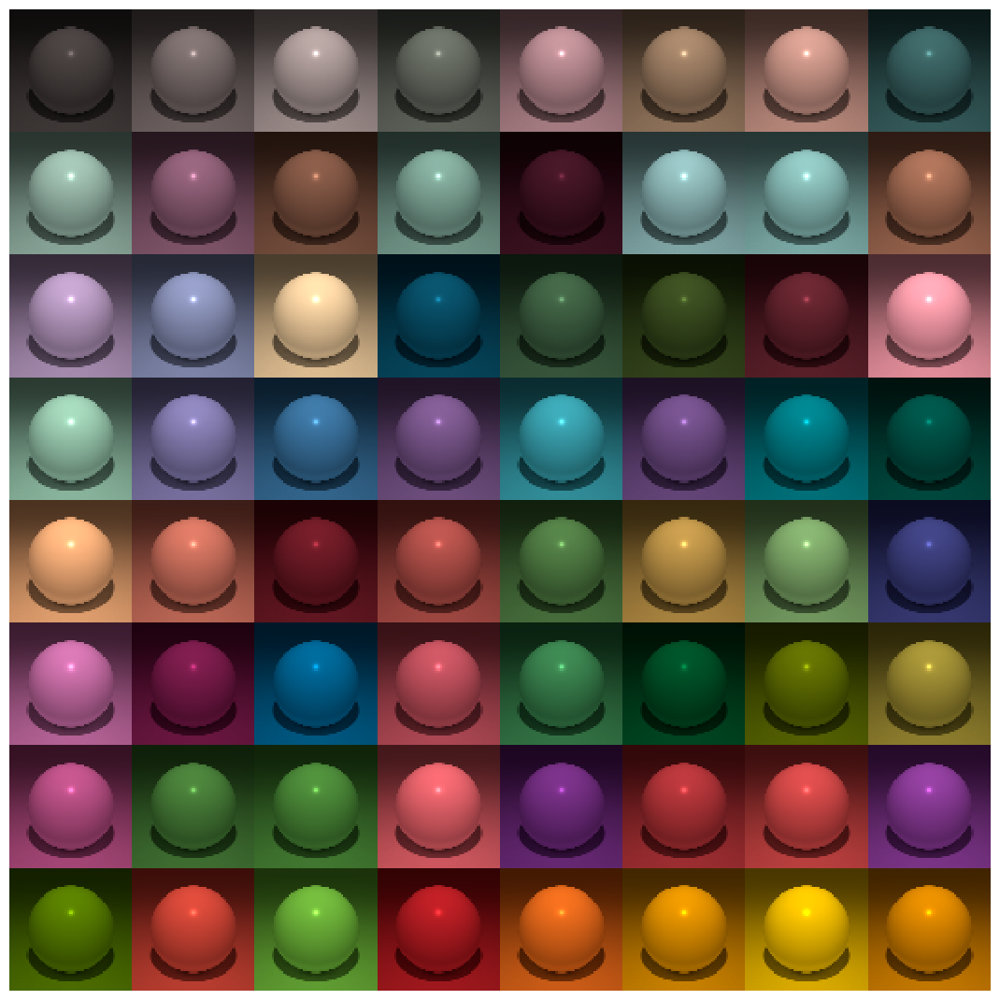

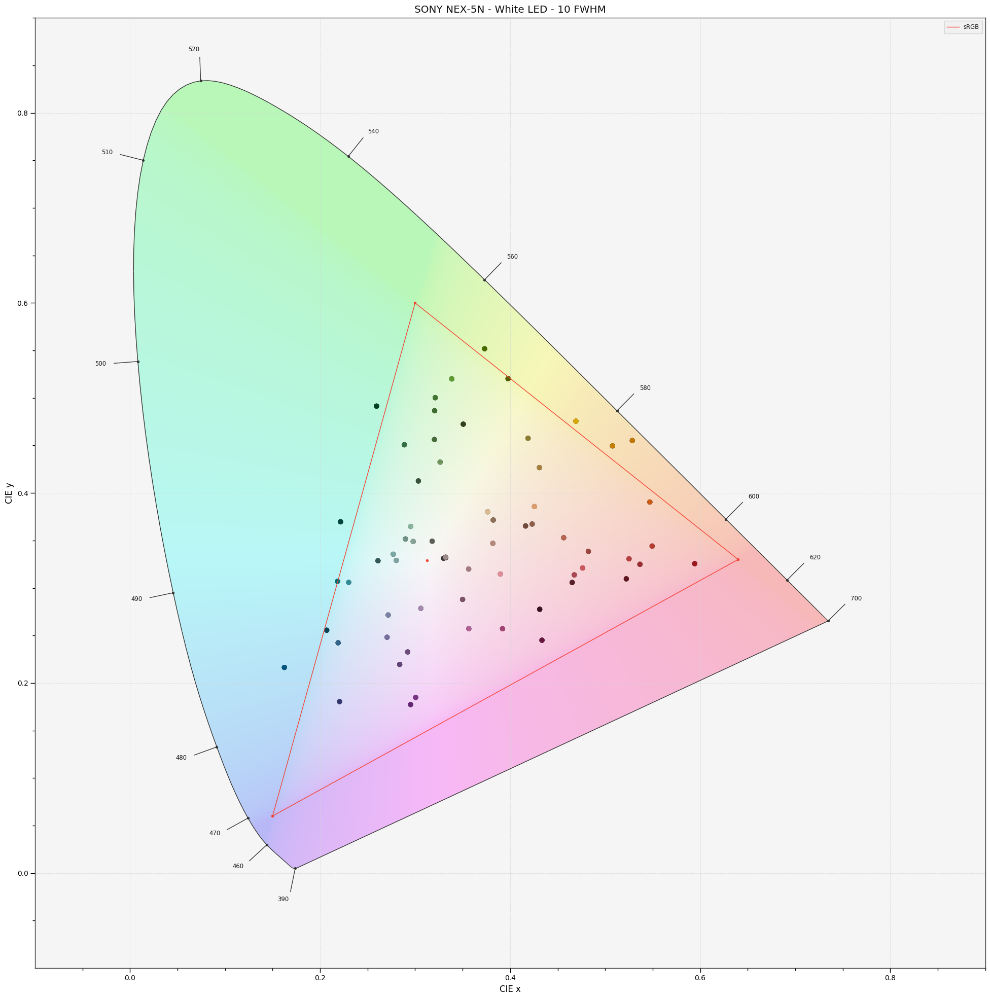

In [0]:
SELECTED_CAMERA_NAMES = [
    # 'Canon 1DMarkIII',
    # 'Canon 20D',
    # 'Canon 300D',
    # 'Canon 40D',
    # 'Canon 500D',
    # 'Canon 50D',
    'Canon 5DMarkII',
    # 'Canon 600D',
    # 'Canon 60D',
    'Hasselblad H2',
    # 'Nikon D200',
    'Nikon D3',
    # 'Nikon D300s',
    # 'Nikon D3X',
    # 'Nikon D40',
    # 'Nikon D50',
    # 'Nikon D5100',
    # 'Nikon D700',
    # 'Nikon D80',
    # 'Nikon D90',
    'Nokia N900',
    'Olympus E-PL2',
    'Pentax K-5',
    # 'Pentax Q',
    'Phase One',
    'Point Grey Grasshopper 50S5C',
    # 'Point Grey Grasshopper2 14S5C',
    'SONY NEX-5N',
    # 'arri d21',
    # 'canon eos 5d mark ii',
    # 'canon powershot s90',
    # 'canon xti',
    # 'nikon d200',
    # 'nikon d5100',
    # 'nikon d70',
    # 'nikon d700',
    # 'nikon d7000',
    # 'sony ilce-7rm2',
    # 'sony ilce-7sm2',
]


def concatenate_images(a, b):
    h_a, w_a = a.shape[:2]
    h_b, w_b = b.shape[:2]
    max_height = np.max([h_a, h_b])
    total_width = w_a + w_b

    c = np.zeros(shape=(max_height, total_width, 3))
    c[:h_a, :w_a] = a
    c[:h_b, w_a:w_a + w_b] = b

    return c


def slugify(a):
    return re.sub(r'(?u)[^-\w.]', '', str(a).strip().replace(' ', '_'))


def render_spectral_image(msds,
                          cmfs,
                          light_sources,
                          idt_matrix=None,
                          swatches_count=SWATCHES,
                          output_directory='{0}/images'.format(OUTPUT_DIRECTORY)):
    RGB_a = []
    for i, (name, light_source) in enumerate(light_sources.items()):
        XYZ = colour.multi_sds_to_XYZ(
            msds,
            method='Integration',
            cmfs=cmfs,
            illuminant=light_source,
            shape=cmfs.shape) / 100

        if idt_matrix is not None:
            XYZ = colour.utilities.dot_vector(idt_matrix, XYZ)

        RGB_a.append(colour.XYZ_to_sRGB(XYZ, apply_cctf_encoding=False))

    steps = msds.shape[0] * len(light_sources) // swatches_count
    steps -= steps // 2

    RGB = RGB_a[0]
    RGB_a = RGB_a[1:]
    for i in range(len(RGB_a)):
        RGB = concatenate_images(RGB, RGB_a[i])

    title = '{0} - {1}'.format(
        cmfs.name, '{0} - {1} FWHM'.format(
            'Coloured LEDs' if len(light_sources) > 1 else 'White LED', FWHM))
    colour.plotting.plot_image(colour.cctf_encoding(RGB))
    colour.write_image(RGB, '{0}/{1}.exr'.format(output_directory,
                                                 slugify(title)))
    colour.plotting.plot_RGB_chromaticities_in_chromaticity_diagram_CIE1931(
        RGB[::steps, ::steps, :],
        diagram_opacity=0.25,
        title=title,
        filename='{0}/{1}_Diagram.png'.format(output_directory,
                                              slugify(title)))


render_spectral_image(SPECTRAL_IMAGE, CMFS,
                      dict(list(LIGHT_SOURCES.items())))

render_spectral_image(SPECTRAL_IMAGE, CMFS, {'White': LIGHT_SOURCE_W})

for camera in SELECTED_CAMERA_NAMES:
    render_spectral_image(
        SPECTRAL_IMAGE, COMPOSITE_CAMERA_SENSITIVITIES_DATABASE[camera],
        dict(list(LIGHT_SOURCES.items())), M_IDT_B[camera])

    render_spectral_image(SPECTRAL_IMAGE,
                          COMPOSITE_CAMERA_SENSITIVITIES_DATABASE[camera],
                          {'White': LIGHT_SOURCE_W}, M_IDT_B[camera])

## Served Content

In [0]:
JS_JERI_CAMERA_DATA_TEMPLATE = """
const cameraData = {{
    title: 'root',
    children: [{camera_data}
    ]
}};"""[1:]

JS_JERI_CAMERA_TEMPLATE = """
{{
    title: '{camera_name}',
    children: [
        {{
            title: 'White LED',
            image: 'images/{slugified_camera_name}_-_White_LED_-_{fwhm}_FWHM.exr',
        }},
        {{
            title: 'MRSE',
            lossMap: {{
                'function': 'MRSE',
                imageA: 'images/CIE_1931_2_Degree_Standard_Observer_-_White_LED_-_{fwhm}_FWHM.exr',
                imageB: 'images/{slugified_camera_name}_-_White_LED_-_{fwhm}_FWHM.exr'
            }}
        }},
        {{
            title: 'Coloured LEDs',
            image: 'images/{slugified_camera_name}_-_Coloured_LEDs_-_{fwhm}_FWHM.exr',
        }},
        {{
            title: 'White LED - Diagram',
            image: 'images/{slugified_camera_name}_-_White_LED_-_{fwhm}_FWHM_Diagram.png',
        }},
        {{
            title: 'Coloured LEDs - Diagram',
            image: 'images/{slugified_camera_name}_-_Coloured_LEDs_-_{fwhm}_FWHM_Diagram.png',
        }}
    ]
}},"""


def generate_js_camera_payload(cameras, output_directory=OUTPUT_DIRECTORY):
    camera_data = textwrap.indent(JS_JERI_CAMERA_TEMPLATE.format(
        **{
            'camera_name': 'Observer',
            'slugified_camera_name': slugify(CMFS_NAME),
            'fwhm': FWHM,
        }), 8 * ' ')
    
    for camera in cameras:
        camera_data += textwrap.indent(JS_JERI_CAMERA_TEMPLATE.format(
            **{
                'camera_name': camera,
                'slugified_camera_name': slugify(camera),
                'fwhm': FWHM,
            }), 8 * ' ')

    with open('{0}/spectral-spheres.js'.format(
        output_directory), 'w') as js_camera_payload:
        js_camera_payload.write(
            JS_JERI_CAMERA_DATA_TEMPLATE.format(
                **{'camera_data': camera_data}))
        

generate_js_camera_payload(SELECTED_CAMERA_NAMES)